In [19]:
from PIL import Image
import json
import os
import requests
from transformers import Blip2Processor, Blip2ForConditionalGeneration
import matplotlib.pyplot as plt
import numpy as np
import torch

In [12]:
def generate_image_caption(model, image_path):

    def load_image(image_path):
        image = Image.open(image_path)
        image = image.convert("RGB")
        return image

    processor, model = model.values()
    image = load_image(image_path)
    inputs = processor(images=image, return_tensors="pt").to(model.device, torch.float16)
    generated_ids = model.generate(**inputs)
    caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0].strip()
    
    return caption

def load_model(model_path, device = "cuda"):

    import torch
    from transformers import Blip2Processor, Blip2ForConditionalGeneration

    device = "cuda:1" if torch.cuda.is_available() else "cpu"
    
    processor = Blip2Processor.from_pretrained("Salesforce/blip2-opt-2.7b")
    model = Blip2ForConditionalGeneration.from_pretrained(
        "Salesforce/blip2-opt-2.7b", torch_dtype=torch.float16
    )
    model.to(device)

    return {
        "processor": processor,
        "model": model
    }

def load_image_paths(image_dir, ignore_dir=["imagic"]):
    # get all image paths in the directory
    image_paths = []

    for root, dirs, files in os.walk(image_dir):
        dirs[:] = [d for d in dirs if d not in ignore_dir]
        for file in files:
            if file.split(".")[-1] in image_types:
                image_paths.append(os.path.join(root, file))

    return image_paths

In [16]:
# load model
model = load_model("Salesforce/blip2-opt-2.7b", device = "cuda:1")

# image paths
image_paths = load_image_paths("tedbench", ignore_dir=["imagic"])
image_paths


['tedbench/cat/cat_3.jpeg',
 'tedbench/cat/cat.jpeg',
 'tedbench/cat/new_cat_3.jpeg',
 'tedbench/cat/goat_and_cat.jpg',
 'tedbench/cat/chibi.jpeg',
 'tedbench/dog/dog_with_shirt.jpg',
 'tedbench/dog/dog_01.jpeg',
 'tedbench/dog/dog2_standing.png',
 'tedbench/dog/door.jpeg',
 'tedbench/dog/two_dogs_with_checkered_shirts1.jpg',
 'tedbench/dog/bear3.jpeg',
 'tedbench/bird/bird.jpeg',
 'tedbench/bird/bird.png',
 'tedbench/bird/bird-g83440b9c4_1920.jpg',
 'tedbench/objects/box.jpeg',
 'tedbench/objects/egg_tree.jpeg',
 'tedbench/objects/tennis_ball.jpeg',
 'tedbench/objects/red_car.jpeg',
 'tedbench/objects/open_book.jpeg',
 'tedbench/objects/chair_1.jpeg',
 'tedbench/objects/vase_01.jpeg',
 'tedbench/food/apples.jpeg',
 'tedbench/food/banana_1.jpeg',
 'tedbench/food/cake_1.jpeg',
 'tedbench/food/pizza1.png',
 'tedbench/food/milk_cookie.jpeg',
 'tedbench/horse/drinking_horse.png',
 'tedbench/horse/flamingo.jpeg',
 'tedbench/horse/teddy_1.jpeg',
 'tedbench/horse/zebra.jpeg',
 'tedbench/horse

/opt/conda/lib/python3.10/site-packages/transformers/generation/utils.py:1346: UserWarning: Using `max_length`'s default (20) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


a cat sitting on a blue bench


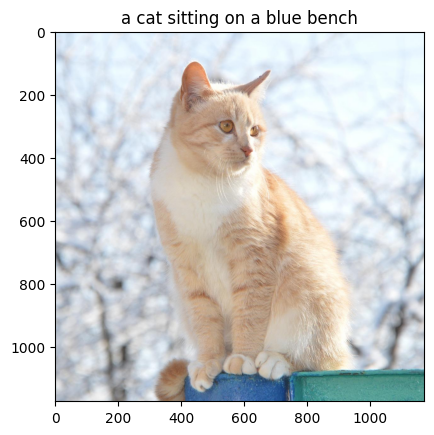

a white cat sitting on the ground


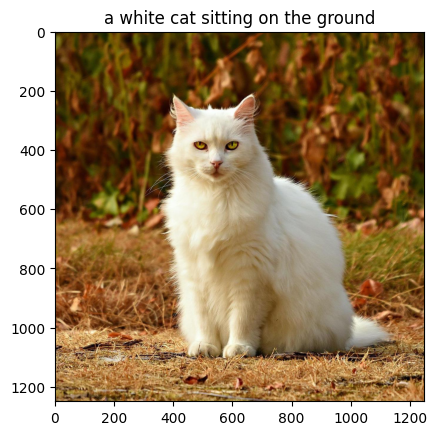

an orange and white cat sitting on a pink background


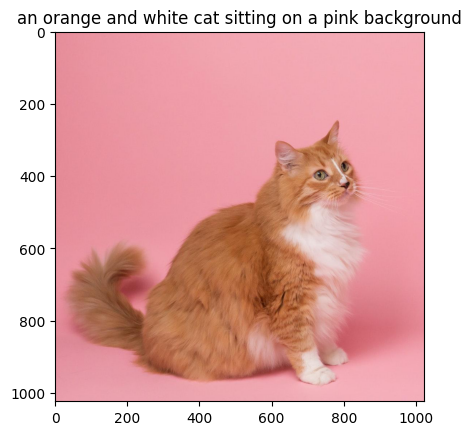

a goat and a cat


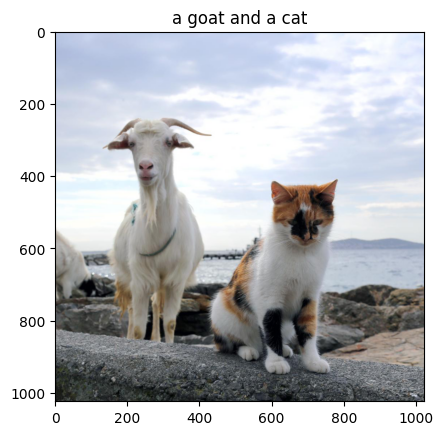

a cat sitting on top of a wooden shelf


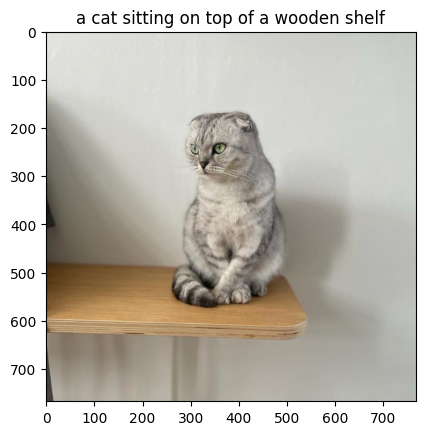

a pug dog wearing a denim jacket


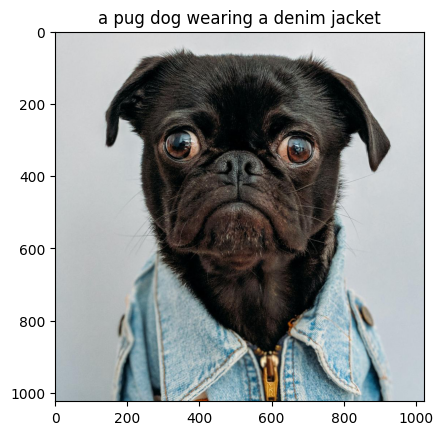

a dog standing on the beach


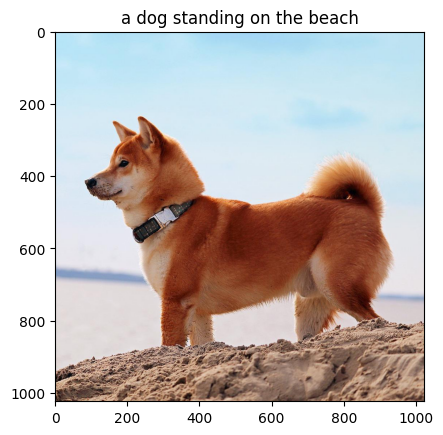

a dog standing in the grass


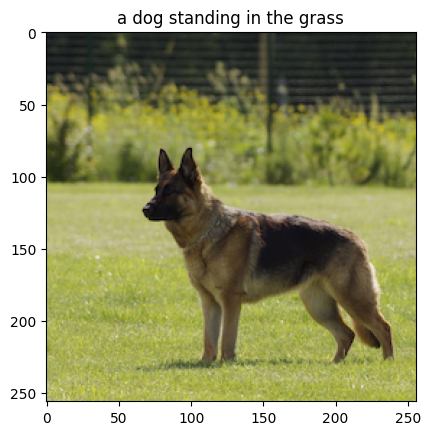

a door with a number on it in an empty room


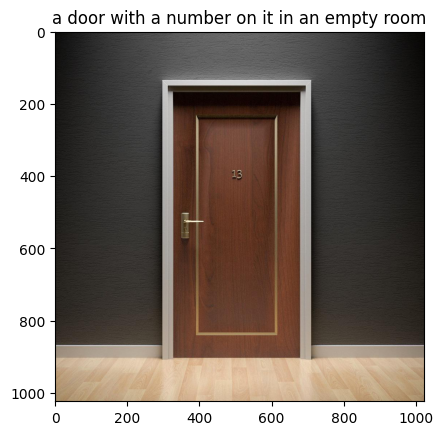

two dogs wearing jackets on a dock


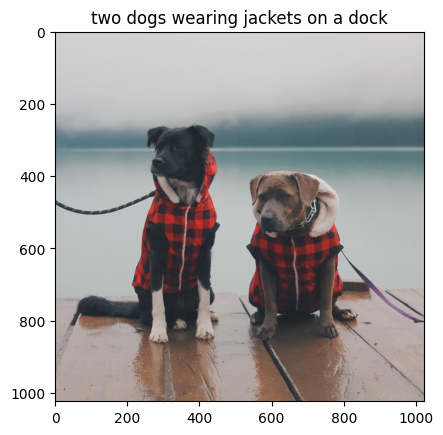

a black bear walking through a grassy field


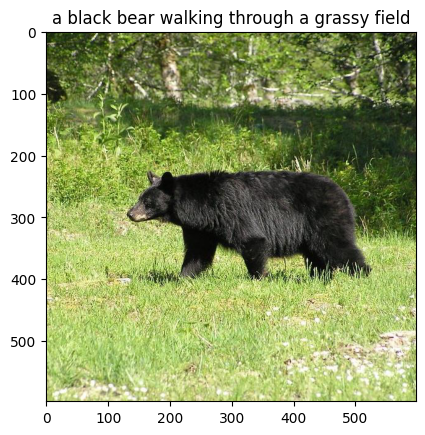

kingfisher, kingfisher, kingfisher, kingfisher, kingfisher


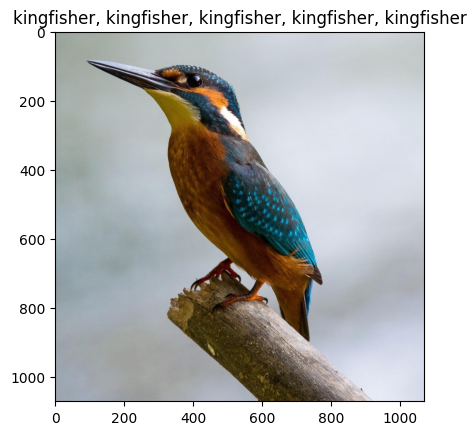

kingfisher, kingfisher, kingfisher, kingfisher, kingfisher


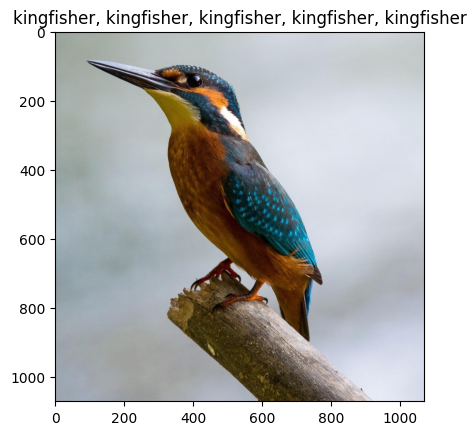

two colorful birds sitting on a rope


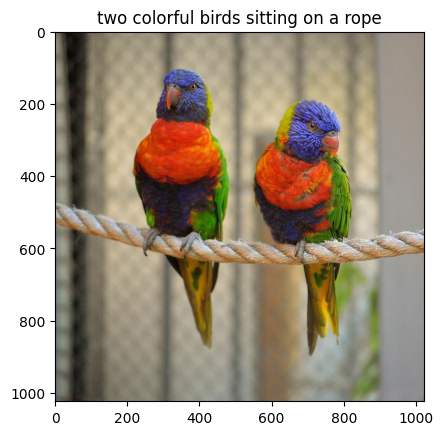

a brown box with a knife on the floor


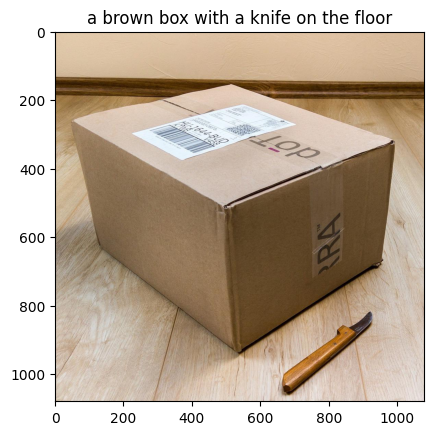

an egg in a nest on top of a green bush


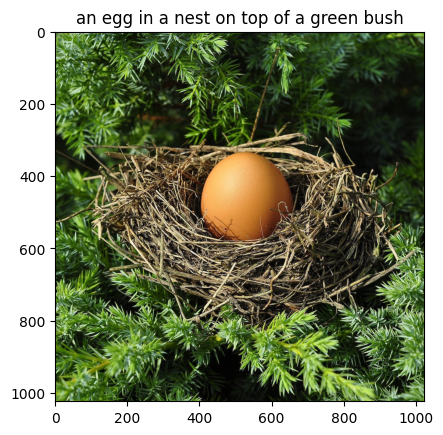

a tennis ball sits on the court


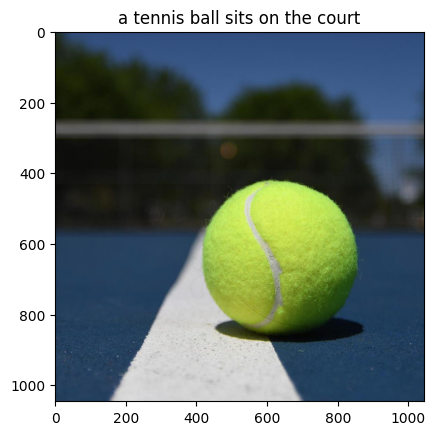

a red car driving down the street


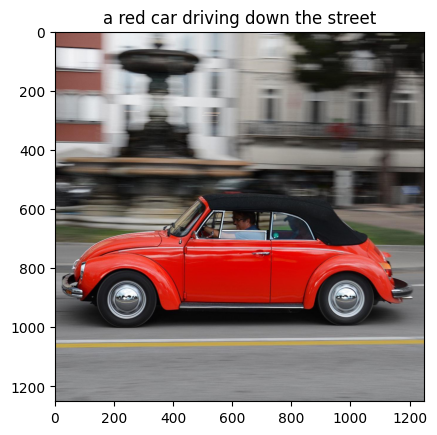

an open book on a bed with a blanket


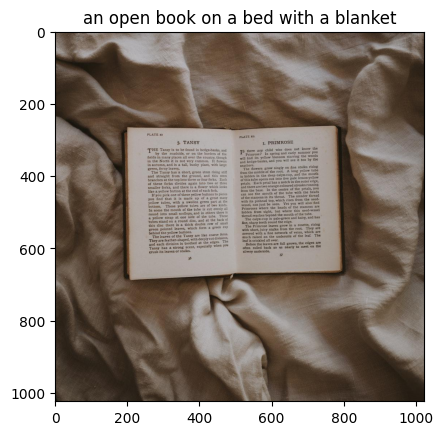

a gray outdoor chair on a patio


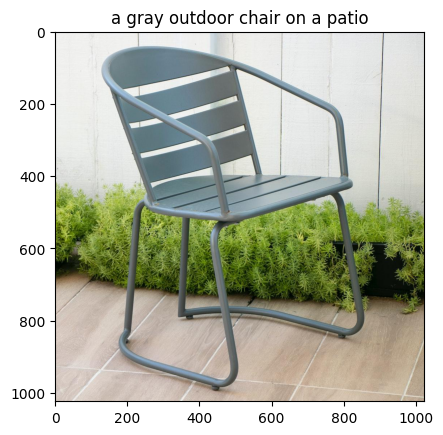

a vase of flowers sitting on a table in front of a window


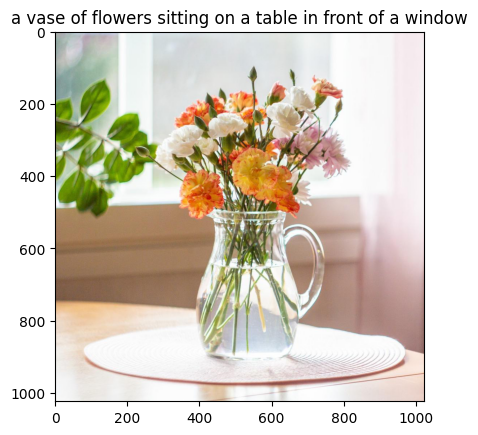

a basket filled with apples sitting on a table


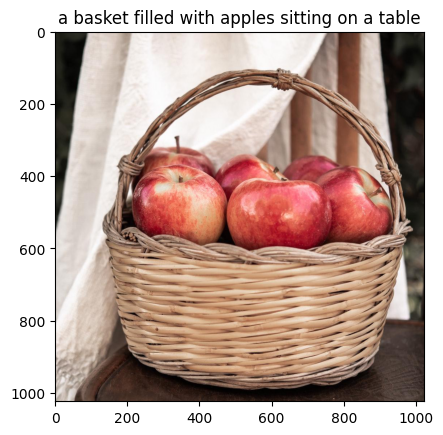

a banana with black spots on it


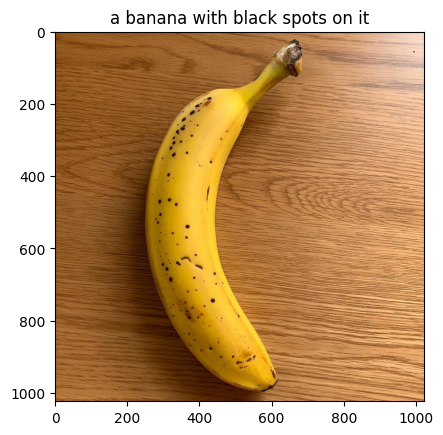

a chocolate cake with chocolate drips on top


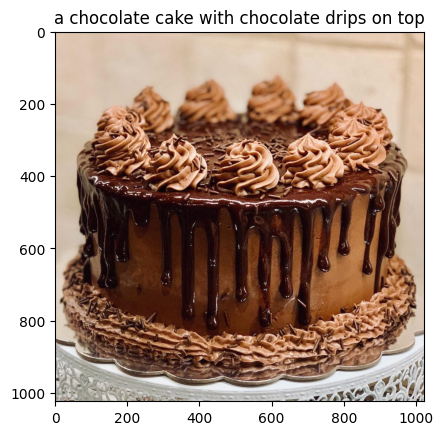

a pizza on a plate


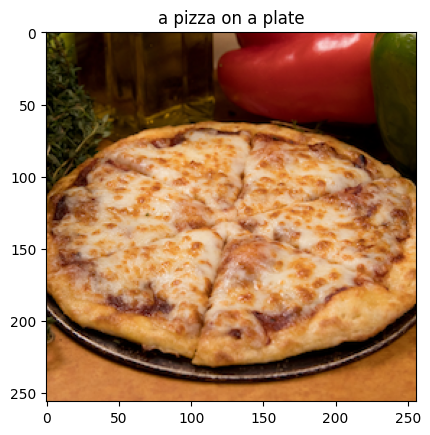

a glass of milk and an oreo cookie on a wooden table


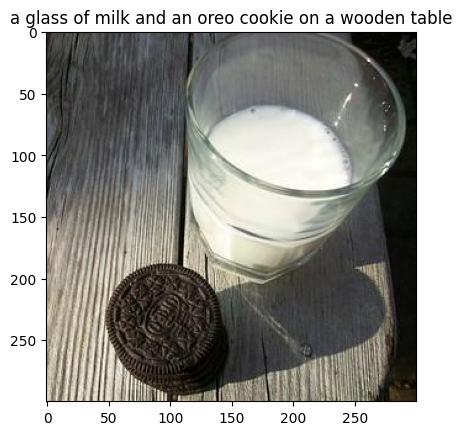

a horse and a bird in a field


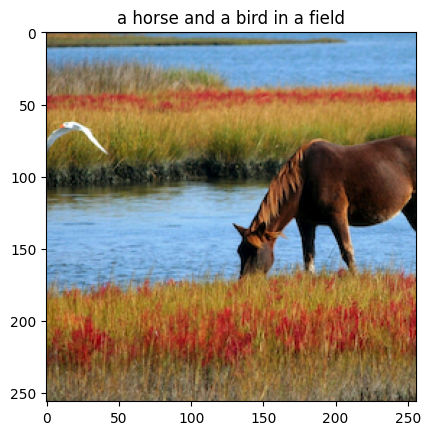

a flamingo standing on the beach near the water


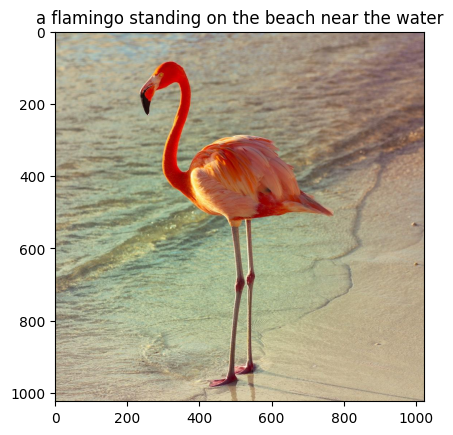

a teddy bear sitting on a wall


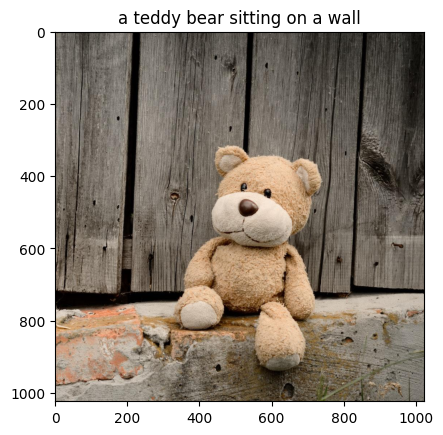

a zebra standing in a field


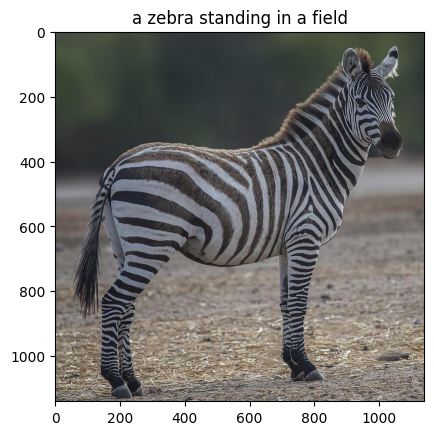

a horse running in the field


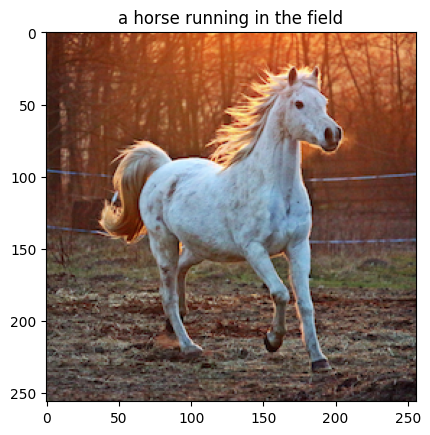

a white horse running in the snow


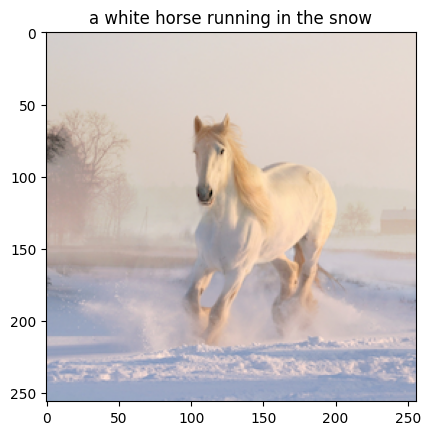

a giraffe standing in the grass with trees in the background


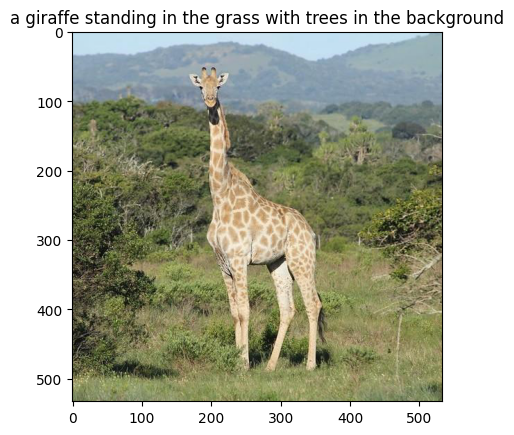

a man in black t - shirt standing on a sidewalk


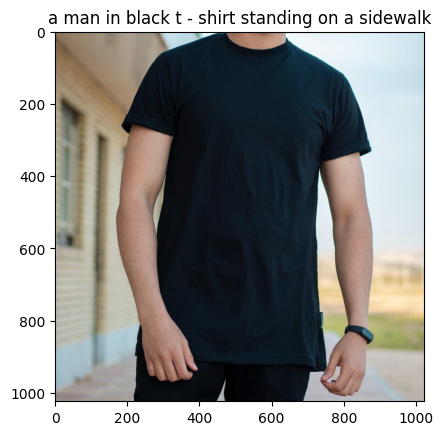

a large elephant walking on a dirt road


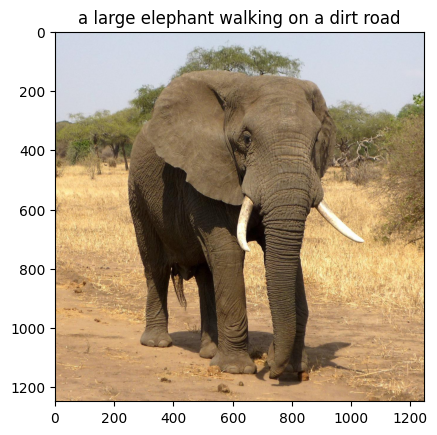

a street with a clock on it


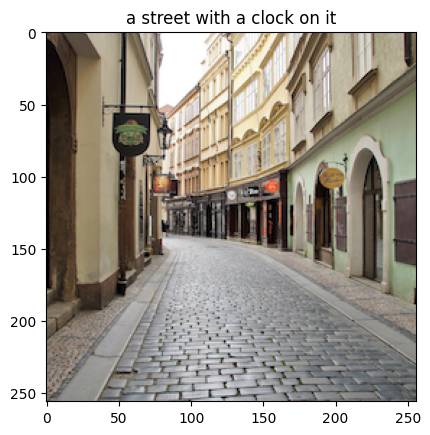

an empty highway with a cloudy sky


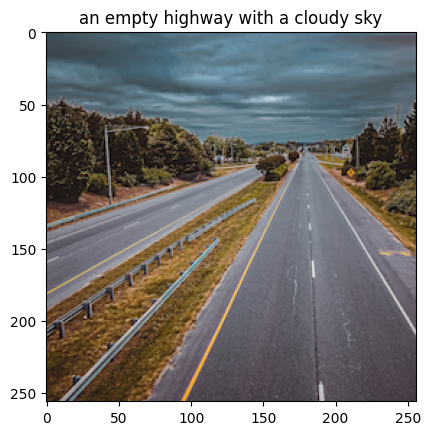

a lone tree stands in a field with green grass


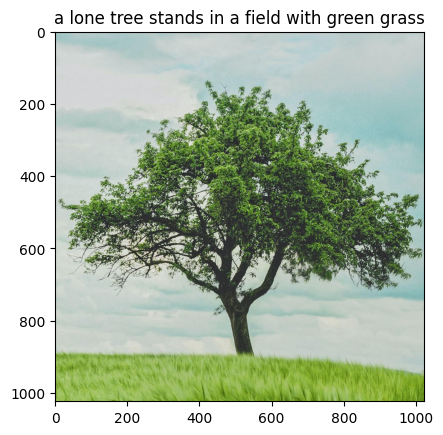

In [21]:
for image_path in image_paths:
    
    caption = generate_image_caption(model, image_path)
    
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(caption)

    # json path
    json_path = os.path.join(image_path.split(".")[0] + ".json")

    with open(json_path, "w") as f:
        json.dump({
            "caption" : caption,
            "image_path" : image_path
        }, f, indent = 4)

    print(caption)
    plt.show()